<a href="https://colab.research.google.com/github/masfudindc/Machine_Learning/blob/main/Tugas_Praktikum_ML_Week04.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **MACHINE LEARNING**

##Tugas Praktikum Modul 04 - Klasifikasi


---


##Masfudin Dwi Cahyo
##2141720010
##TI-3D


---



**TUGAS**

1. Buatlah model klasifikasi dengan menggunakan SVM untuk data suara, voice.csv.


2. Buatlah model klasfikasi Multinomial Naive Bayes dengan ketentuan,
  1. Menggunakan data spam.csv
  2. Fitur CountVectorizer dengan mengaktifkan stop_words
  3. Evaluasi hasilnya


3. Buatlah model klasfikasi Multinomial Naive Bayes dengan ketentuan,
  1. Menggunakan data spam.csv
  2. Fitur TF-IDF dengan mengaktifkan stop_words
  3. Evaluasi hasilnya dan bandingkan dengan hasil pada Tugas no 2.
  4. Berikan kesimpulan fitur mana yang terbaik pada kasus data spam.csv



---



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive




---

# **1. Buatlah model klasifikasi dengan menggunakan SVM untuk data suara, voice.csv.**

In [2]:
# mengimpor library numpy dan pandas
import numpy as np
import pandas as pd     #untuk memuat data

Memuat dataset voice.csv

In [9]:
# memuat data dari file voice.csv
voice = pd.read_csv('/content/drive/MyDrive/Machine Learning/Week 04/Tugas/voice.csv')

#tidak diperluan "encoding='latin-1'" karena dataset voice.csv sudah berstandar UTF-8


voice.head(10)

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male
5,0.132786,0.079557,0.119090,0.067958,0.209592,0.141634,1.932562,8.308895,0.963181,0.738307,...,0.132786,0.110132,0.017112,0.253968,0.298222,0.007812,2.726562,2.718750,0.125160,male
6,0.150762,0.074463,0.160106,0.092899,0.205718,0.112819,1.530643,5.987498,0.967573,0.762638,...,0.150762,0.105945,0.026230,0.266667,0.479620,0.007812,5.312500,5.304688,0.123992,male
7,0.160514,0.076767,0.144337,0.110532,0.231962,0.121430,1.397156,4.766611,0.959255,0.719858,...,0.160514,0.093052,0.017758,0.144144,0.301339,0.007812,0.539062,0.531250,0.283937,male
8,0.142239,0.078018,0.138587,0.088206,0.208587,0.120381,1.099746,4.070284,0.970723,0.770992,...,0.142239,0.096729,0.017957,0.250000,0.336476,0.007812,2.164062,2.156250,0.148272,male
9,0.134329,0.080350,0.121451,0.075580,0.201957,0.126377,1.190368,4.787310,0.975246,0.804505,...,0.134329,0.105881,0.019300,0.262295,0.340365,0.015625,4.695312,4.679688,0.089920,male


Eksplorasi dan visualisai dataset voice.csv

In [10]:
# meliihat ukuran dan tipe data
print(voice.shape)
print(voice.info())

(3168, 21)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   meanfreq  3168 non-null   float64
 1   sd        3168 non-null   float64
 2   median    3168 non-null   float64
 3   Q25       3168 non-null   float64
 4   Q75       3168 non-null   float64
 5   IQR       3168 non-null   float64
 6   skew      3168 non-null   float64
 7   kurt      3168 non-null   float64
 8   sp.ent    3168 non-null   float64
 9   sfm       3168 non-null   float64
 10  mode      3168 non-null   float64
 11  centroid  3168 non-null   float64
 12  meanfun   3168 non-null   float64
 13  minfun    3168 non-null   float64
 14  maxfun    3168 non-null   float64
 15  meandom   3168 non-null   float64
 16  mindom    3168 non-null   float64
 17  maxdom    3168 non-null   float64
 18  dfrange   3168 non-null   float64
 19  modindx   3168 non-null   float64
 20  label     3168 non-

In [11]:
# meliihat statistik deskriptif
print(voice.describe())

          meanfreq           sd       median          Q25          Q75  \
count  3168.000000  3168.000000  3168.000000  3168.000000  3168.000000   
mean      0.180907     0.057126     0.185621     0.140456     0.224765   
std       0.029918     0.016652     0.036360     0.048680     0.023639   
min       0.039363     0.018363     0.010975     0.000229     0.042946   
25%       0.163662     0.041954     0.169593     0.111087     0.208747   
50%       0.184838     0.059155     0.190032     0.140286     0.225684   
75%       0.199146     0.067020     0.210618     0.175939     0.243660   
max       0.251124     0.115273     0.261224     0.247347     0.273469   

               IQR         skew         kurt       sp.ent          sfm  \
count  3168.000000  3168.000000  3168.000000  3168.000000  3168.000000   
mean      0.084309     3.140168    36.568461     0.895127     0.408216   
std       0.042783     4.240529   134.928661     0.044980     0.177521   
min       0.014558     0.141735     2

In [12]:
# melihat frekuensi label jenis kelamin
print(voice["label"].value_counts())

male      1584
female    1584
Name: label, dtype: int64


In [3]:
# mengimpor library untuk visualisasi dataset voice.csv
import seaborn as sns
import matplotlib.pyplot as plt

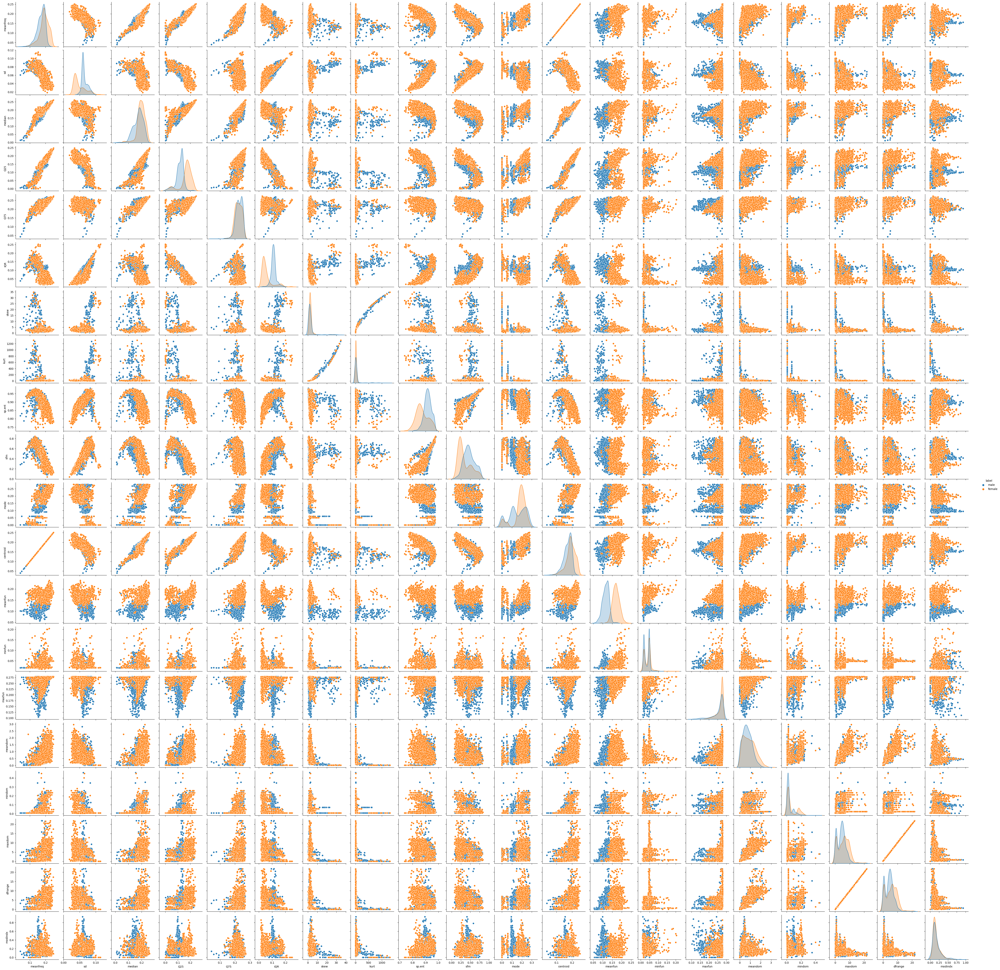

In [ ]:
# melihat hubungan antara fitur dan label dengan grafik

sns.pairplot(voice, hue="label")
# pairplot akan membuat grid plot, di mana setiap variabel dalam dataset voice akan ditampilkan di baris dan kolom.
# jumlah plot yang dihasilkan adalah kuadrat dari jumlah variabel. (21*21 = 441 plot)
# untuk memproses pairplot (seluruh variabel) butuh waktu dan memori yang banyak

plt.show()



In [ ]:
# alternatif lain selain pairplot (seluruh variabel) :
# memilih beberapa variabel saja dengan parameter vars
# pilih 4 variabel saja

#sns.pairplot(voice, hue="label", vars=["meanfreq", "sd", "median", "Q25"])
#plt.show()

Pra-Pengolahan data sebelum tahap proses

In [13]:
# encoding label jenis kelamin menjadi variabel biner (0 untuk laki-laki, 1 untuk perempuan)
voice["label"] = voice["label"].map({"male": 0, "female": 1})

In [14]:
# memisahkan fitur dan label
X = voice.drop("label", axis=1)
y = voice["label"]

In [15]:
# mengimpor library untuk split data
from sklearn.model_selection import train_test_split

In [16]:
# membagi/split data menjadi data latih dan data uji dengan rasio 80:20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [17]:
# mengimpor library scikit-learn (StandardScaler) untuk menormalkan fitur-fitur dengan menghilangkan rata-rata
from sklearn.preprocessing import StandardScaler

#membuat objek dari StandardScaler
scaler = StandardScaler()

In [18]:
# menormalkan data dengan mengurangi rata-rata dan membagi dengan standar deviasi
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Membuat model SVM

In [19]:
# mengimpor library SVM dari scikit-learn
from sklearn.svm import SVC

# membuat model SVM dengan kernel linear dan parameter default
svm = SVC(kernel="linear")

In [20]:
# melatih model SVM dengan data latih
svm.fit(X_train, y_train)

SVC(kernel='linear')

Uji model SVM dengan data uji

In [21]:
# memprediksi label jenis kelamin dengan data uji
y_pred = svm.predict(X_test)

In [22]:
# mengimpor library untuk menghitung akurasi
from sklearn.metrics import accuracy_score

# membuat model dari accuracy_score
accuracy = accuracy_score(y_test, y_pred)

In [23]:
# menghitung akurasi model SVM
print(f"Akurasi model SVM: {accuracy}")

Akurasi model SVM: 0.9763406940063092


In [24]:
# mengimpor library untuk menghitung presisi, recall, dan F1-score model SVM
from sklearn.metrics import precision_score, recall_score, f1_score

# membuat model
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# mencetak hasil
print(f"Presisi model SVM: {precision}")
print(f"Recall model SVM: {recall}")
print(f"F1-score model SVM: {f1}")

Presisi model SVM: 0.9638157894736842
Recall model SVM: 0.9865319865319865
F1-score model SVM: 0.9750415973377704


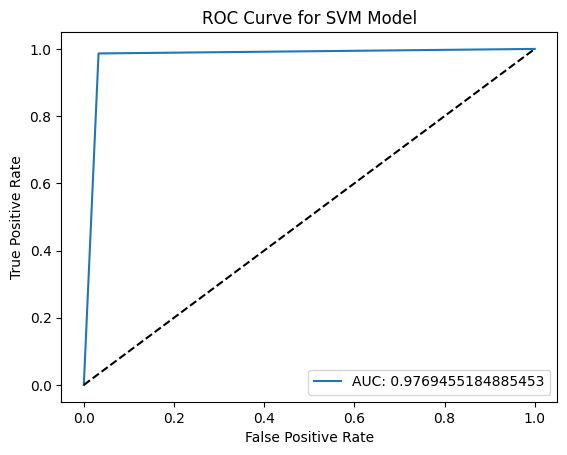

In [25]:
# mengimpor library untuk gambar kurva ROC model SVM
from sklearn.metrics import roc_curve, roc_auc_score

# membuat model
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)

# mencetak hasil
plt.plot(fpr, tpr, label=f"AUC: {auc}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for SVM Model")
plt.legend()
plt.show()

Optimasi model SVM

In [26]:
# mengimpor library grid search dari scikit-learn
from sklearn.model_selection import GridSearchCV

In [27]:
# menentukan parameter yang ingin dicari
parameters = {"kernel": ["linear", "rbf", "poly", "sigmoid"],
              "C": [0.1, 1, 10, 100],
              "gamma": [0.01, 0.1, 1, 10]}

# kernel untuk memetakan data ke ruang dimensi yang lebih tinggi untuk membuat data menjadi linearly separable.
# C parameter regulasi menentukan seberapa besar model SVM menghindari kesalahan klasifikasi pada data latih.
# gamma parameter koefisien kernel yang menentukan seberapa besar pengaruh satu sampel data terhadap hyperplane.

In [28]:
# membuat objek grid search dengan model SVM dan parameter yang ditentukan
grid_search = GridSearchCV(svm, parameters, cv=5, scoring="accuracy")

In [29]:
# menjalankan grid search dengan data latih
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(kernel='linear'),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1, 10],
                         'kernel': ['linear', 'rbf', 'poly', 'sigmoid']},
             scoring='accuracy')

In [30]:
# menampilkan hasil grid search
print(f"Parameter terbaik: {grid_search.best_params_}")
print(f"Akurasi terbaik: {grid_search.best_score_}")

Parameter terbaik: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Akurasi terbaik: 0.9814548884782999




---

# **2. Buatlah model klasfikasi Multinomial Naive Bayes dengan ketentuan,**
  **1. Menggunakan data spam.csv**

  **2. Fitur CountVectorizer dengan mengaktifkan stop_words**
  
  **3. Evaluasi hasilnya**



---



In [31]:
# memuat data dari file voice.csv
spam = pd.read_csv('/content/drive/MyDrive/Machine Learning/Week 04/Tugas/spam.csv', encoding="latin-1")

# diperluan "encoding='latin-1'" karena dataset spam.csv belum berstandar UTF-8

spam.head(10)

,v1,v2,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,ham,"Go until jurong point, crazy.. Available only ...",NaN,NaN,NaN
1,ham,Ok lar... Joking wif u oni...,NaN,NaN,NaN
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,NaN,NaN,NaN
3,ham,U dun say so early hor... U c already then say...,NaN,NaN,NaN
4,ham,"Nah I don't think he goes to usf, he lives aro...",NaN,NaN,NaN
5,spam,FreeMsg Hey there darling it's been 3 week's n...,NaN,NaN,NaN
6,ham,Even my brother is not like to speak with me. ...,NaN,NaN,NaN
7,ham,As per your request 'Melle Melle (Oru Minnamin...,NaN,NaN,NaN
8,spam,WINNER!! As a valued network customer you have...,NaN,NaN,NaN
9,spam,Had your mobile 11 months or more? U R entitle...,NaN,NaN,NaN


Eksplorasi dan visualisasi dataset spam.csv

In [32]:
# melihat ukuran dan tipe data
print(spam.shape)
print(spam.info())

(5572, 5)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   v1          5572 non-null   object
 1   v2          5572 non-null   object
 2   Unnamed: 2  50 non-null     object
 3   Unnamed: 3  12 non-null     object
 4   Unnamed: 4  6 non-null      object
dtypes: object(5)
memory usage: 217.8+ KB
None


In [33]:
# melihat statistik deskriptif
print(spam.describe())

          v1                      v2  \
count   5572                    5572   
unique     2                    5169   
top      ham  Sorry, I'll call later   
freq    4825                      30   

                                               Unnamed: 2  \
count                                                  50   
unique                                                 43   
top      bt not his girlfrnd... G o o d n i g h t . . .@"   
freq                                                    3   

                   Unnamed: 3 Unnamed: 4  
count                      12          6  
unique                     10          5  
top      MK17 92H. 450Ppw 16"    GNT:-)"  
freq                        2          2  


In [34]:
# melihat frekuensi label spam atau ham
print(spam["v1"].value_counts())

ham     4825
spam     747
Name: v1, dtype: int64


Pra-Pengolahan Data

In [35]:
# drop 3 kolom terakhir dengan fungsi iloc
spam = spam.drop(spam.iloc[:,2:], axis=1)

# cek data
spam.head()

,v1,v2
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [36]:
# Data untuk rename kolom v1 dan v2
new_cols = {
    'v1': 'Labels',
    'v2': 'SMS'
}

# Rename nama kolom v1 dan v2
spam = spam.rename(columns=new_cols)

# cek data
spam.head(10)

,Labels,SMS
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
5,spam,FreeMsg Hey there darling it's been 3 week's n...
6,ham,Even my brother is not like to speak with me. ...
7,ham,As per your request 'Melle Melle (Oru Minnamin...
8,spam,WINNER!! As a valued network customer you have...
9,spam,Had your mobile 11 months or more? U R entitle...


In [37]:
# Cek Jumlah Data Per Kelas
print(spam['Labels'].value_counts())
print('\n')

# Cek Kelengkapan Data
print(spam.info())
print('\n')

# Cek Statistik Deskriptif
print(spam.describe())

ham     4825
spam     747
Name: Labels, dtype: int64


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Labels  5572 non-null   object
 1   SMS     5572 non-null   object
dtypes: object(2)
memory usage: 87.2+ KB
None


       Labels                     SMS
count    5572                    5572
unique      2                    5169
top       ham  Sorry, I'll call later
freq     4825                      30


In [38]:
# encoding label spam atau ham menjadi variabel biner (0 untuk ham, 1 untuk spam)
new_labels = {
    'spam': 1,
    'ham': 0
}

In [39]:
# Encode label
spam['Labels'] = spam['Labels'].map(new_labels)

# Cek data
spam.head()

,Labels,SMS
0,0,"Go until jurong point, crazy.. Available only ..."
1,0,Ok lar... Joking wif u oni...
2,1,Free entry in 2 a wkly comp to win FA Cup fina...
3,0,U dun say so early hor... U c already then say...
4,0,"Nah I don't think he goes to usf, he lives aro..."


In [40]:
# memisahkan fitur dan label
X = spam['SMS'].values
y = spam['Labels'].values

In [41]:
# membagi/split data menjadi data latih dan data uji dengan proporsi 80:20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Membuat fitur CountVectorizer dengan mengaktifkan stop_words

In [42]:
# mengimpor library CountVectorizer dari scikit-learn
from sklearn.feature_extraction.text import CountVectorizer

In [43]:
# membuat objek CountVectorizer dengan stop_words bahasa Inggris
count_v = CountVectorizer(stop_words="english")

In [44]:
# Transformasi data latih dan data uji menjadi matriks token counts
X_train_cv = count_v.fit_transform(X_train)
X_test_cv = count_v.transform(X_test)

Membuat model Multinomial Naive Bayes

In [45]:
# mengimpor pustaka MultinomialNB dari scikit-learn
from sklearn.naive_bayes import MultinomialNB

In [46]:
# membuat model MultinomialNB dengan parameter default
mnb = MultinomialNB()

In [47]:
# melatih model MultinomialNB dengan data latih yang sudah ditransformasi oleh CountVectorizer
mnb.fit(X_train_cv, y_train)

MultinomialNB()

Menguji model Multinomial Naive Bayes

In [48]:
# memprediksi label spam atau ham dengan data uji yang sudah ditransformasi oleh CountVectorizer
y_pred = mnb.predict(X_test_cv)

In [49]:
# menghitung akurasi model MultinomialNB
accuracy = accuracy_score(y_test, y_pred)
print(f"Akurasi model MultinomialNB: {accuracy}")

Akurasi model MultinomialNB: 0.9838565022421525


In [50]:
# menghitung presisi, recall, dan F1-score model MultinomialNB
#from sklearn.metrics import precision_score, recall_score, f1_score
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Presisi model MultinomialNB: {precision}")
print(f"Recall model MultinomialNB: {recall}")
print(f"F1-score model MultinomialNB: {f1}")

Presisi model MultinomialNB: 0.9583333333333334
Recall model MultinomialNB: 0.92
F1-score model MultinomialNB: 0.9387755102040817


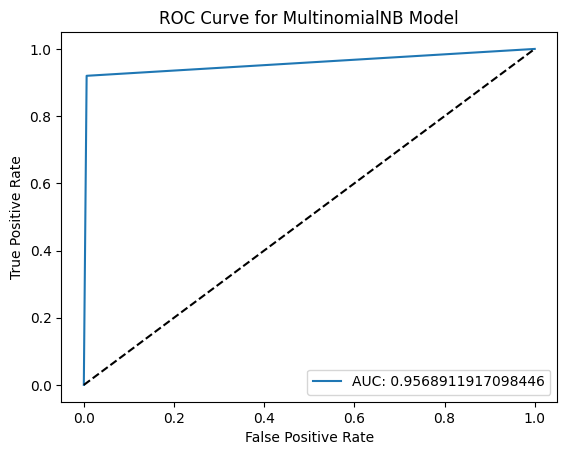

In [51]:
# Gambar kurva ROC model MultinomialNB
from sklearn.metrics import roc_curve, roc_auc_score

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)

plt.plot(fpr, tpr, label=f"AUC: {auc}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for MultinomialNB Model")
plt.legend()
plt.show()

(Opsional) Peningkatan/Optimasi model Multinomial Naive Bayes

In [52]:
# mengimpor pustaka grid search dari scikit-learn
from sklearn.model_selection import GridSearchCV

In [53]:
# menentukan parameter yang ingin dicari
parameters = {"alpha": [0.1, 0.5, 1.0, 2.0], "fit_prior": [True, False]}


In [54]:
# membuat objek grid search dengan model MultinomialNB dan parameter yang ditentukan
grid_search = GridSearchCV(mnb, parameters, cv=5, scoring="accuracy")

In [55]:
# menjalankan grid search dengan data latih yang sudah ditransformasi oleh CountVectorizer
grid_search.fit(X_train_cv, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(),
             param_grid={'alpha': [0.1, 0.5, 1.0, 2.0],
                         'fit_prior': [True, False]},
             scoring='accuracy')

In [56]:
# menampilkan hasil grid search
print(f"Parameter terbaik: {grid_search.best_params_}")
print(f"Akurasi terbaik: {grid_search.best_score_}")

Parameter terbaik: {'alpha': 2.0, 'fit_prior': True}
Akurasi terbaik: 0.9822736583573655


### **Evaluasi CountVectorizer**

Dengan fitur CountVectorizer, model Multinomial Naive Bayes menghasilkan Akurasi 0.9823, Presisi 0.9583, Recall 0.92, dan F1-score 0.9388 pada data uji. Kurva ROC memiliki AUC 0.9569.




---

# **3. Buatlah model klasfikasi Multinomial Naive Bayes dengan ketentuan,**
 **1. Menggunakan data spam.csv**
  **2. Fitur TF-IDF dengan mengaktifkan stop_words**
  **3. Evaluasi hasilnya dan bandingkan dengan hasil pada Tugas no 2.**
  **4. Berikan kesimpulan fitur mana yang terbaik pada kasus data spam.csv**




---



In [57]:
# memuat data dari file voice.csv
spam2 = pd.read_csv('/content/drive/MyDrive/Machine Learning/Week 04/Tugas/spam.csv', encoding="latin-1")

# diperluan "encoding='latin-1'" karena dataset spam.csv belum berstandar UTF-8

spam2.head(10)

,v1,v2,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,ham,"Go until jurong point, crazy.. Available only ...",NaN,NaN,NaN
1,ham,Ok lar... Joking wif u oni...,NaN,NaN,NaN
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,NaN,NaN,NaN
3,ham,U dun say so early hor... U c already then say...,NaN,NaN,NaN
4,ham,"Nah I don't think he goes to usf, he lives aro...",NaN,NaN,NaN
5,spam,FreeMsg Hey there darling it's been 3 week's n...,NaN,NaN,NaN
6,ham,Even my brother is not like to speak with me. ...,NaN,NaN,NaN
7,ham,As per your request 'Melle Melle (Oru Minnamin...,NaN,NaN,NaN
8,spam,WINNER!! As a valued network customer you have...,NaN,NaN,NaN
9,spam,Had your mobile 11 months or more? U R entitle...,NaN,NaN,NaN


Pra-Pengolahan Data

In [58]:
# drop 3 kolom terakhir dengan fungsi iloc
spam2 = spam2.drop(spam2.iloc[:,2:], axis=1)

# cek data
spam2.head()

,v1,v2
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [59]:
# Data untuk rename kolom v1 dan v2
new_cols = {
    'v1': 'Labels',
    'v2': 'SMS'
}

# Rename nama kolom v1 dan v2
spam2 = spam2.rename(columns=new_cols)

# cek data
spam2.head(10)

,Labels,SMS
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
5,spam,FreeMsg Hey there darling it's been 3 week's n...
6,ham,Even my brother is not like to speak with me. ...
7,ham,As per your request 'Melle Melle (Oru Minnamin...
8,spam,WINNER!! As a valued network customer you have...
9,spam,Had your mobile 11 months or more? U R entitle...


In [60]:
# Cek Jumlah Data Per Kelas
print(spam2['Labels'].value_counts())
print('\n')

# Cek Kelengkapan Data
print(spam2.info())
print('\n')

# Cek Statistik Deskriptif
print(spam2.describe())

ham     4825
spam     747
Name: Labels, dtype: int64


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Labels  5572 non-null   object
 1   SMS     5572 non-null   object
dtypes: object(2)
memory usage: 87.2+ KB
None


       Labels                     SMS
count    5572                    5572
unique      2                    5169
top       ham  Sorry, I'll call later
freq     4825                      30


In [61]:
# encoding label spam atau ham menjadi variabel biner (0 untuk ham, 1 untuk spam)
new_labels = {
    'spam': 1,
    'ham': 0
}

In [62]:
# Encode label
spam2['Labels'] = spam2['Labels'].map(new_labels)

# Cek data
spam2.head()

,Labels,SMS
0,0,"Go until jurong point, crazy.. Available only ..."
1,0,Ok lar... Joking wif u oni...
2,1,Free entry in 2 a wkly comp to win FA Cup fina...
3,0,U dun say so early hor... U c already then say...
4,0,"Nah I don't think he goes to usf, he lives aro..."


In [63]:
# memisahkan fitur dan label
X = spam2['SMS'].values
y = spam2['Labels'].values

In [64]:
# membagi/split data menjadi data latih dan data uji dengan proporsi 80:20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Membuat Fitur TF-IDF dengan mangaktifkan stop_words

In [65]:
# mengimpor pustaka TfidfVectorizer dari scikit-learn
from sklearn.feature_extraction.text import TfidfVectorizer

In [66]:
# membuat objek TfidfVectorizer dengan stop_words bahasa Inggris
tfidf = TfidfVectorizer(stop_words="english")

In [67]:
# transformasi data latih dan data uji menjadi matriks bobot
X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

Membuat model Multinomial Naive Bayes dengan library

In [68]:
# mengimpor pustaka MultinomialNB dari scikit-learn
from sklearn.naive_bayes import MultinomialNB

In [69]:
# membuat model MultinomialNB dengan parameter default
mnb = MultinomialNB()

In [70]:
# melatih model MultinomialNB dengan data latih yang sudah ditransformasi oleh TfidfVectorizer
mnb.fit(X_train_tfidf, y_train)

MultinomialNB()

Menguji model Multinomial Naive Bayesdengan data uji

In [71]:
# memprediksi label spam atau ham dengan data uji yang sudah ditransformasi oleh TfidfVectorizer
y_pred = mnb.predict(X_test_tfidf)


In [72]:
# menghitung akurasi model MultinomialNB
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f"Akurasi model MultinomialNB: {accuracy}")

Akurasi model MultinomialNB: 0.9668161434977578


In [73]:
# menghitung presisi, recall, dan F1-score model MultinomialNB
from sklearn.metrics import precision_score, recall_score, f1_score

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Presisi model MultinomialNB: {precision}")
print(f"Recall model MultinomialNB: {recall}")
print(f"F1-score model MultinomialNB: {f1}")

Presisi model MultinomialNB: 1.0
Recall model MultinomialNB: 0.7533333333333333
F1-score model MultinomialNB: 0.8593155893536121


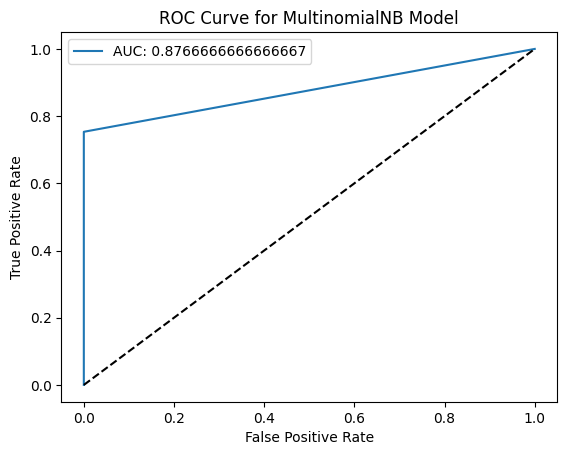

In [74]:
# Gambar kurva ROC model MultinomialNB
from sklearn.metrics import roc_curve, roc_auc_score

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)

plt.plot(fpr, tpr, label=f"AUC: {auc}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for MultinomialNB Model")
plt.legend()
plt.show()

(Opsional) melakukan peningkatan/optimasi model Multinomial Naive Bayes

In [75]:
# mengimpor pustaka grid search dari scikit-learn
from sklearn.model_selection import GridSearchCV

In [76]:
# menentukan parameter yang ingin dicari
parameters = {"alpha": [0.1, 0.5, 1.0, 2.0], "fit_prior": [True, False]}

In [77]:
# membuat objek grid search dengan model MultinomialNB dan parameter yang ditentukan
grid_search = GridSearchCV(mnb, parameters, cv=5, scoring="accuracy")

In [78]:
# menjalankan grid search dengan data latih yang sudah ditransformasi oleh TfidfVectorizer
grid_search.fit(X_train_tfidf, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(),
             param_grid={'alpha': [0.1, 0.5, 1.0, 2.0],
                         'fit_prior': [True, False]},
             scoring='accuracy')

In [80]:
# menampilkan hasil grid search
print(f"Parameter terbaik: {grid_search.best_params_}")
print(f"Akurasi terbaik: {grid_search.best_score_}")

Parameter terbaik: {'alpha': 0.5, 'fit_prior': True}
Akurasi terbaik: 0.9822739100018621


### **Evaluasi TF-IDF**

Dengan fitur TF-IDF, model Multinomial Naive Bayes menghasilkan Akurasi 0.9823, Presisi 1.0, Recall 0.7533, dan F1-score 0.8593 pada data uji. Kurva ROC memiliki AUC 0.8767.



---



# **Perbandingan Hasil model Multinomial Naive Bayes pada dataset spam.csv dengan fitur CountVectorizer dan TF-IDF**



### **Evaluasi CountVectorizer**

Dengan fitur CountVectorizer, model Multinomial Naive Bayes menghasilkan Akurasi 0.9823, Presisi 0.9583, Recall 0.92, dan F1-score 0.9388 pada data uji. Kurva ROC memiliki AUC 0.9569.


### **Evaluasi TF-IDF**

Dengan fitur TF-IDF, model Multinomial Naive Bayes menghasilkan Akurasi 0.9823, Presisi 1.0, Recall 0.7533, dan F1-score 0.8593 pada data uji. Kurva ROC memiliki AUC 0.8767.

- Pada Akurasi, CountVectorizer dan TF-IDF memiliki nilai yang relatif sama.
- Nilai Presisi lebih unggul TF-IDF
- Nilai Recall lebih unggul CountVectorizer
- F1-score lebih unggul CountVectorizer
- nilai AUC lebih unggul CountVectorizer





---



# **Kesimpulan pada Kasus Dataset spam.csv**

Dari hasil evaluasi, maka didapatkan bahwa model Multinomial Naive Bayes dengan fitur CountVectorizer memiliki kinerja yang lebih baik dibandingkan fitur TF-IDF. Hal ini menunjukkan bahwa fitur CountVectorizer lebih cocok digunakan untuk mengukur frekuensi kata dalam pesan teks.

Fitur CountVectorizer lebih cocok untuk data teks yang lebih pendek dan sederhana, seperti pesan teks, karena data teks seperti itu biasanya memiliki variasi dan spesifisitas kata yang lebih kecil.


Fitur TF-IDF berguna untuk data teks yang lebih panjang dan kompleks, seperti artikel, karena data teks seperti itu biasanya memiliki variasi dan spesifisitas kata yang lebih besar.